# Get read counts per specimen. Using parquet files

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import genetools
import seaborn as sns

sns.set_style("dark")

In [2]:
import pandas as pd

In [3]:
from slugify import slugify

In [4]:
import dask
import dask.dataframe as dd

In [5]:
import os

In [6]:
from malid import config

Raise worker connection timeouts (see other dask notebooks):

In [7]:
import distributed

# These only seem to be picked up by scheduler, not by individual workers

dask.config.set(
    {
        "distributed.comm.timeouts.tcp": "120s",
        "distributed.comm.timeouts.connect": "120s",
        "distributed.comm.retry.count": 5,
    }
)

In [8]:
# These will be picked up by individual workers

with open(os.path.expandvars("$HOME/.config/dask/distributed.yaml"), "w") as w:
    w.write(
        """distributed:
  comm:
    retry:
      count: 5
    timeouts:
      connect: 120s          # time before connecting fails
      tcp: 120s              # time before calling an unresponsive connection dead
    """
    )

In [9]:
from dask.distributed import Client

# multi-processing backend
# access dashbaord at http://127.0.0.1:61083
# if already opened from another notebook, see https://stackoverflow.com/questions/60115736/dask-how-to-connect-to-running-cluster-scheduler-and-access-total-occupancy
client = Client(
    scheduler_port=61084,
    dashboard_address=":61083",
    n_workers=7,
    processes=True,
    threads_per_worker=8,
    memory_limit="auto",
    worker_dashboard_address=":0",  # start worker dashboards on random ports
)
display(client)
# for debugging: client.restart()

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:61083/status,
Dashboard: http://127.0.0.1:61083/status,Workers: 7
Total threads: 56,Total memory: 1.15 TiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:61084,Workers: 7
Dashboard: http://127.0.0.1:61083/status,Total threads: 56
Started: Just now,Total memory: 1.15 TiB
Comm: tcp://127.0.0.1:46347,Total threads: 8
Dashboard: http://127.0.0.1:38455/status,Memory: 167.92 GiB
Nanny: tcp://127.0.0.1:43835,


In [10]:
desired_cols = [
    "participant_label",
    "specimen_label",
    "extracted_isotype",
    "disease",
    "disease_subtype",
    "num_reads",
]

In [11]:
debug_filters = None
# debug_filters = [("participant_label", "==", "BFI-0007450")]

In [12]:
# Don't use fastparquet, because it changes specimen labels like M54-049 to 2049-01-01 00:00:54 -- i.e. it coerces partition names to numbers or dates
df = dd.read_parquet(
    config.paths.sequences,
    columns=desired_cols,
    filters=debug_filters,
    engine="pyarrow",
)

In [13]:
df

,participant_label,specimen_label,extracted_isotype,disease,disease_subtype,num_reads
npartitions=717,,,,,,
,category[known],category[known],category[unknown],category[unknown],category[unknown],int64
,...,...,...,...,...,...
...,...,...,...,...,...,...
,...,...,...,...,...,...
,...,...,...,...,...,...


In [14]:
# sum num_reads and also sum of unique vdj sequences (count)

In [15]:
num_reads_per_specimen_isotype = df.map_partitions(
    lambda part: part.groupby(
        [
            "participant_label",
            "specimen_label",
            "disease",
            "disease_subtype",
            "extracted_isotype",
        ],
        observed=True,
    )["num_reads"]
    .sum()
    .rename("num_reads_per_specimen_isotype")
)

In [16]:
num_unique_vdj_per_specimen_isotype = df.map_partitions(
    lambda part: part.groupby(
        [
            "participant_label",
            "specimen_label",
            "disease",
            "disease_subtype",
            "extracted_isotype",
        ],
        observed=True,
    )
    .size()
    .rename("num_unique_vdj_per_specimen_isotype")
)

In [17]:
# dask.visualize(
#     num_reads_per_specimen_isotype,
#     num_unique_vdj_per_specimen_isotype,
#     filename="read_counts_per_specimen.dask_task_graph.pdf",
# )

In [18]:
%%time
num_reads_per_specimen_isotype_c, num_unique_vdj_per_specimen_isotype_c = dask.compute(
    num_reads_per_specimen_isotype, num_unique_vdj_per_specimen_isotype
)

CPU times: user 10.3 s, sys: 2.22 s, total: 12.5 s
Wall time: 22.1 s


In [19]:
num_reads_per_specimen_isotype_c

participant_label  specimen_label  disease             disease_subtype                    extracted_isotype
BFI-0000234        M124-S014       Healthy/Background  Healthy/Background - HIV Negative  IGHA2                  4747
                                                                                          IGHM                  15093
                                                                                          IGHG1                  9082
                                                                                          IGHA1                 17653
                                                                                          IGHD                  29169
                                                                                                                ...  
BFI-0010245        M464-S046       Healthy/Background  Healthy/Background (children)      IGHE                  27441
                                                                  

In [20]:
num_unique_vdj_per_specimen_isotype_c

participant_label  specimen_label  disease             disease_subtype                    extracted_isotype
BFI-0000234        M124-S014       Healthy/Background  Healthy/Background - HIV Negative  IGHA2                 4282
                                                                                          IGHM                 14466
                                                                                          IGHG1                 7484
                                                                                          IGHA1                14510
                                                                                          IGHD                 27679
                                                                                                               ...  
BFI-0010245        M464-S046       Healthy/Background  Healthy/Background (children)      IGHE                  3185
                                                                         

In [21]:
num_reads_per_specimen_isotype_df = num_reads_per_specimen_isotype_c.reset_index()
num_reads_per_specimen_isotype_df.head()

,participant_label,specimen_label,disease,disease_subtype,extracted_isotype,num_reads_per_specimen_isotype
0,BFI-0000234,M124-S014,Healthy/Background,Healthy/Background - HIV Negative,IGHA2,4747
1,BFI-0000234,M124-S014,Healthy/Background,Healthy/Background - HIV Negative,IGHM,15093
2,BFI-0000234,M124-S014,Healthy/Background,Healthy/Background - HIV Negative,IGHG1,9082
3,BFI-0000234,M124-S014,Healthy/Background,Healthy/Background - HIV Negative,IGHA1,17653
4,BFI-0000234,M124-S014,Healthy/Background,Healthy/Background - HIV Negative,IGHD,29169


In [22]:
num_unique_vdj_per_specimen_isotype_df = (
    num_unique_vdj_per_specimen_isotype_c.reset_index()
)
num_unique_vdj_per_specimen_isotype_df.head()

,participant_label,specimen_label,disease,disease_subtype,extracted_isotype,num_unique_vdj_per_specimen_isotype
0,BFI-0000234,M124-S014,Healthy/Background,Healthy/Background - HIV Negative,IGHA2,4282
1,BFI-0000234,M124-S014,Healthy/Background,Healthy/Background - HIV Negative,IGHM,14466
2,BFI-0000234,M124-S014,Healthy/Background,Healthy/Background - HIV Negative,IGHG1,7484
3,BFI-0000234,M124-S014,Healthy/Background,Healthy/Background - HIV Negative,IGHA1,14510
4,BFI-0000234,M124-S014,Healthy/Background,Healthy/Background - HIV Negative,IGHD,27679


In [23]:
# Clean up
client.shutdown()

# Export pivoted

In [24]:
num_reads_per_specimen_isotype_df_pivot = num_reads_per_specimen_isotype_df.pivot(
    index=["participant_label", "specimen_label", "disease", "disease_subtype"],
    columns=["extracted_isotype"],
    values="num_reads_per_specimen_isotype",
)
num_reads_per_specimen_isotype_df_pivot

extracted_isotype                                                                       IGHA2  \
participant_label specimen_label disease            disease_subtype                             
BFI-0000234       M124-S014      Healthy/Background Healthy/Background - HIV Negative  4747.0   
                  M132-S014      Healthy/Background Healthy/Background - HIV Negative     NaN   
BFI-0000254       M111-S037      HIV                HIV Broad Neutralizing             9498.0   
                  M114-S037      HIV                HIV Broad Neutralizing                NaN   
BFI-0000255       M111-S033      HIV                HIV Broad Neutralizing             5375.0   
...                                                                                       ...   
BFI-0010241       M464-S042      Healthy/Background Healthy/Background (children)      2585.0   
BFI-0010242       M464-S043      Healthy/Background Healthy/Background (children)       951.0   
BFI-0010243       M464-S044      Healthy/Background Healthy/Background (children)      3715.0   
BFI-0010244       M464-S045      Healthy/Background Healthy/Background (children)       575.0   
BFI-0010245       M464-S046      Healthy/Background Healthy/Background (children)      5517.0   

extracted_isotype                                                                         IGHM  \
participant_label specimen_label disease            disease_subtype                              
BFI-0000234       M124-S014      Healthy/Background Healthy/Background - HIV Negative  15093.0   
                  M132-S014      Healthy/Background Healthy/Background - HIV Negative      NaN   
BFI-0000254       M111-S037      HIV                HIV Broad Neutralizing             25760.0   
                  M114-S037      HIV                HIV Broad Neutralizing                 NaN   
BFI-0000255       M111-S033      HIV                HIV Broad Neutralizing             13444.0   
...                                                                                        ...   
BFI-0010241       M464-S042      Healthy/Background Healthy/Background (children)      34714.0   
BFI-0010242       M464-S043      Healthy/Background Healthy/Background (children)      11501.0   
BFI-0010243       M464-S044      Healthy/Background Healthy/Background (children)      42009.0   
BFI-0010244       M464-S045      Healthy/Background Healthy/Background (children)      44222.0   
BFI-0010245       M464-S046      Healthy/Background Healthy/Background (children)      37498.0   

extracted_isotype                                                                        IGHG1  \
participant_label specimen_label disease            disease_subtype                              
BFI-0000234       M124-S014      Healthy/Background Healthy/Background - HIV Negative   9082.0   
                  M132-S014      Healthy/Background Healthy/Background - HIV Negative      NaN   
BFI-0000254       M111-S037      HIV                HIV Broad Neutralizing             14547.0   
                  M114-S037      HIV                HIV Broad Neutralizing                 NaN   
BFI-0000255       M111-S033      HIV                HIV Broad Neutralizing              7288.0   
...                                                                                        ...   
BFI-0010241       M464-S042      Healthy/Background Healthy/Background (children)      20618.0   
BFI-0010242       M464-S043      Healthy/Background Healthy/Background (children)       1030.0   
BFI-0010243       M464-S044      Healthy/Background Healthy/Background (children)      24695.0   
BFI-0010244       M464-S045      Healthy/Background Healthy/Background (children)      33494.0   
BFI-0010245       M464-S046      Healthy/Background Healthy/Background (children)      18868.0   

extracted_isotype                                                                        IGHA1  \
participant_label specimen_label disease            disease_subtype                       

In [25]:
num_reads_per_specimen_isotype_df_pivot.to_csv(
    f"{config.paths.base_output_dir}/reads_per_specimen_and_isotype.tsv", sep="\t"
)

In [26]:
num_unique_vdj_per_specimen_isotype_df_pivot = (
    num_unique_vdj_per_specimen_isotype_df.pivot(
        index=["participant_label", "specimen_label", "disease", "disease_subtype"],
        columns=["extracted_isotype"],
        values="num_unique_vdj_per_specimen_isotype",
    )
)
num_unique_vdj_per_specimen_isotype_df_pivot

extracted_isotype                                                                       IGHA2  \
participant_label specimen_label disease            disease_subtype                             
BFI-0000234       M124-S014      Healthy/Background Healthy/Background - HIV Negative  4282.0   
                  M132-S014      Healthy/Background Healthy/Background - HIV Negative     NaN   
BFI-0000254       M111-S037      HIV                HIV Broad Neutralizing             6289.0   
                  M114-S037      HIV                HIV Broad Neutralizing                NaN   
BFI-0000255       M111-S033      HIV                HIV Broad Neutralizing             4731.0   
...                                                                                       ...   
BFI-0010241       M464-S042      Healthy/Background Healthy/Background (children)      1490.0   
BFI-0010242       M464-S043      Healthy/Background Healthy/Background (children)       324.0   
BFI-0010243       M464-S044      Healthy/Background Healthy/Background (children)      2125.0   
BFI-0010244       M464-S045      Healthy/Background Healthy/Background (children)       386.0   
BFI-0010245       M464-S046      Healthy/Background Healthy/Background (children)      2624.0   

extracted_isotype                                                                         IGHM  \
participant_label specimen_label disease            disease_subtype                              
BFI-0000234       M124-S014      Healthy/Background Healthy/Background - HIV Negative  14466.0   
                  M132-S014      Healthy/Background Healthy/Background - HIV Negative      NaN   
BFI-0000254       M111-S037      HIV                HIV Broad Neutralizing             24005.0   
                  M114-S037      HIV                HIV Broad Neutralizing                 NaN   
BFI-0000255       M111-S033      HIV                HIV Broad Neutralizing             12895.0   
...                                                                                        ...   
BFI-0010241       M464-S042      Healthy/Background Healthy/Background (children)      22498.0   
BFI-0010242       M464-S043      Healthy/Background Healthy/Background (children)       2050.0   
BFI-0010243       M464-S044      Healthy/Background Healthy/Background (children)      34701.0   
BFI-0010244       M464-S045      Healthy/Background Healthy/Background (children)      32078.0   
BFI-0010245       M464-S046      Healthy/Background Healthy/Background (children)      27473.0   

extracted_isotype                                                                        IGHG1  \
participant_label specimen_label disease            disease_subtype                              
BFI-0000234       M124-S014      Healthy/Background Healthy/Background - HIV Negative   7484.0   
                  M132-S014      Healthy/Background Healthy/Background - HIV Negative      NaN   
BFI-0000254       M111-S037      HIV                HIV Broad Neutralizing              8639.0   
                  M114-S037      HIV                HIV Broad Neutralizing                 NaN   
BFI-0000255       M111-S033      HIV                HIV Broad Neutralizing              6721.0   
...                                                                                        ...   
BFI-0010241       M464-S042      Healthy/Background Healthy/Background (children)       8005.0   
BFI-0010242       M464-S043      Healthy/Background Healthy/Background (children)        326.0   
BFI-0010243       M464-S044      Healthy/Background Healthy/Background (children)      10824.0   
BFI-0010244       M464-S045      Healthy/Background Healthy/Background (children)      14995.0   
BFI-0010245       M464-S046      Healthy/Background Healthy/Background (children)       8158.0   

extracted_isotype                                                                        IGHA1  \
participant_label specimen_label disease            disease_subtype                       

In [27]:
num_unique_vdj_per_specimen_isotype_df_pivot.to_csv(
    f"{config.paths.base_output_dir}/unique_vdj_per_specimen_and_isotype.tsv", sep="\t"
)

# Plots of all specimens

2023-01-14 03:15:56,556 - distributed.client - ERROR - Failed to reconnect to scheduler after 120.00 seconds, closing client


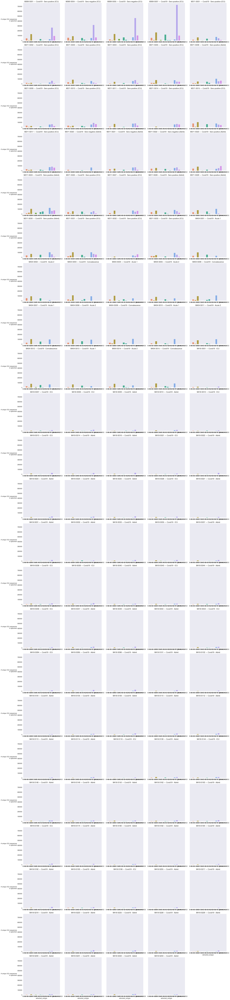

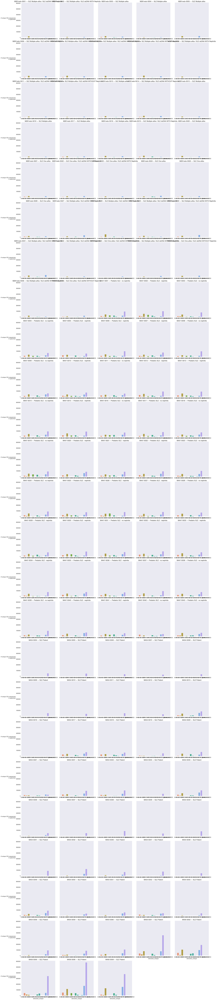

In [28]:
for disease, grp in num_unique_vdj_per_specimen_isotype_df.groupby("disease"):
    # Remove missing categories so they are not plotted below as empty boxes
    grp = grp.copy()
    grp["specimen_label"] = grp["specimen_label"].cat.remove_unused_categories()

    g = sns.catplot(
        data=grp,
        x="extracted_isotype",
        y="num_unique_vdj_per_specimen_isotype",
        col="specimen_label",
        col_wrap=5,
        kind="bar",
        sharey=True,
        #     aspect=0.6,
        sharex=True,
        ci=False,
    )

    # Remove "specimen_label =" prefix for titles
    g.set_titles("{col_name}")

    g.set_ylabels(
        "# unique VDJ sequences\nin specimen", rotation=0, horizontalalignment="right"
    )

    # repeat x axis labels for all facets
    for ax in g.axes.flatten():
        ax.tick_params(labelbottom=True)

    # Clear titles
    g.set_titles("")

    # Set title with other dataframe columns
    # can't change title with .map() because .map() will set titles again
    for ax, ((i, j, k), data) in zip(g.axes.flat, g.facet_data()):
        # for each facet:
        # i,j,k are indexes into row_, col_, hue_names attributes
        # data is the subsetted data for this facet
        # could also get ax by: ax = fg.facet_axis(i, j)
        if data.empty:
            # hide plot entirely if it's empty
            ax.set_axis_off()
        else:
            ax.set_title(
                f'{data["specimen_label"].iloc[0]} — {data["disease_subtype"].iloc[0]}'
            )

    genetools.plots.savefig(
        g.fig,
        f"{config.paths.base_output_dir}/repertoire_read_counts.unique_vdj_sequences.{slugify(disease)}.png",
        dpi=72,
    )

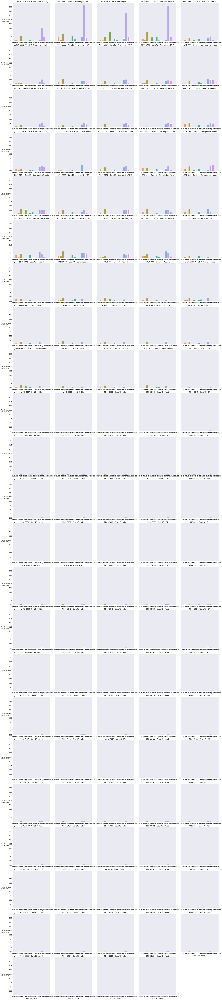

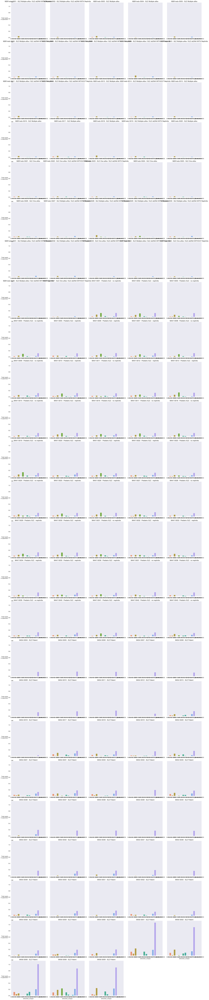

In [29]:
for disease, grp in num_reads_per_specimen_isotype_df.groupby("disease"):
    # Remove missing categories so they are not plotted below as empty boxes
    grp = grp.copy()
    grp["specimen_label"] = grp["specimen_label"].cat.remove_unused_categories()

    g = sns.catplot(
        data=grp,
        x="extracted_isotype",
        y="num_reads_per_specimen_isotype",
        col="specimen_label",
        col_wrap=5,
        kind="bar",
        sharey=True,
        #     aspect=0.6,
        sharex=True,
        ci=False,
    )

    # Remove "specimen_label =" prefix for titles
    g.set_titles("{col_name}")

    g.set_ylabels("Total reads\nin specimen", rotation=0, horizontalalignment="right")

    # repeat x axis labels for all facets
    for ax in g.axes.flatten():
        ax.tick_params(labelbottom=True)

    # Clear titles
    g.set_titles("")

    # Set title with other dataframe columns
    # can't change title with .map() because .map() will set titles again
    for ax, ((i, j, k), data) in zip(g.axes.flat, g.facet_data()):
        # for each facet:
        # i,j,k are indexes into row_, col_, hue_names attributes
        # data is the subsetted data for this facet
        # could also get ax by: ax = fg.facet_axis(i, j)
        if data.empty:
            # hide plot entirely if it's empty
            ax.set_axis_off()
        else:
            ax.set_title(
                f'{data["specimen_label"].iloc[0]} - {data["disease_subtype"].iloc[0]}'
            )

    genetools.plots.savefig(
        g.fig,
        f"{config.paths.base_output_dir}/repertoire_read_counts.total_reads.{slugify(disease)}.png",
        dpi=72,
    )

# Roll up by disease

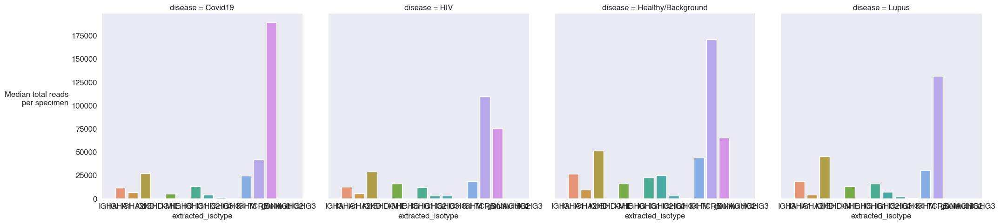

In [30]:
g = sns.catplot(
    data=num_reads_per_specimen_isotype_df.groupby(["disease", "extracted_isotype"])[
        "num_reads_per_specimen_isotype"
    ]
    .median()
    .reset_index(),
    x="extracted_isotype",
    y="num_reads_per_specimen_isotype",
    col="disease",
    col_wrap=5,
    kind="bar",
    sharey=True,
    #     aspect=0.6,
    sharex=True,
    ci=False,
)
g.set_ylabels(
    "Median total reads\nper specimen", rotation=0, horizontalalignment="right"
)


genetools.plots.savefig(
    g.fig,
    f"{config.paths.base_output_dir}/repertoire_read_counts.total_reads.by_disease.shared_ylims.png",
    dpi=100,
)

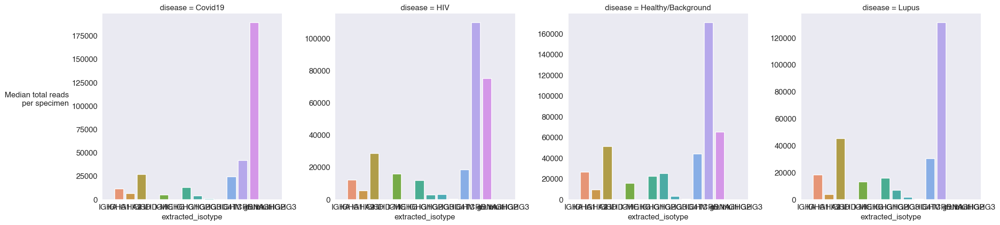

In [31]:
g = sns.catplot(
    data=num_reads_per_specimen_isotype_df.groupby(["disease", "extracted_isotype"])[
        "num_reads_per_specimen_isotype"
    ]
    .median()
    .reset_index(),
    x="extracted_isotype",
    y="num_reads_per_specimen_isotype",
    col="disease",
    col_wrap=5,
    kind="bar",
    sharey=False,
    #     aspect=0.6,
    sharex=True,
    ci=False,
)
g.set_ylabels(
    "Median total reads\nper specimen", rotation=0, horizontalalignment="right"
)

genetools.plots.savefig(
    g.fig,
    f"{config.paths.base_output_dir}/repertoire_read_counts.total_reads.by_disease.png",
    dpi=100,
)

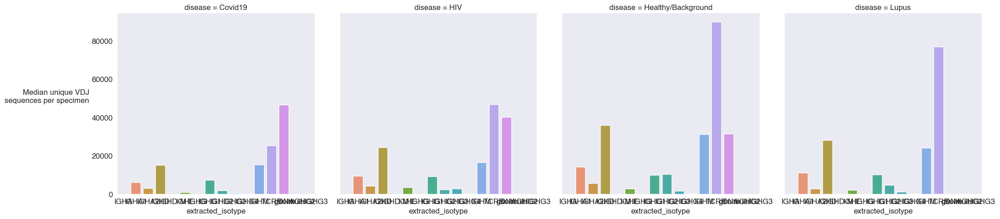

In [32]:
g = sns.catplot(
    data=num_unique_vdj_per_specimen_isotype_df.groupby(
        ["disease", "extracted_isotype"]
    )["num_unique_vdj_per_specimen_isotype"]
    .median()
    .reset_index(),
    x="extracted_isotype",
    y="num_unique_vdj_per_specimen_isotype",
    col="disease",
    col_wrap=5,
    kind="bar",
    sharey=True,
    #     aspect=0.6,
    sharex=True,
    ci=False,
)
g.set_ylabels(
    "Median unique VDJ\nsequences per specimen", rotation=0, horizontalalignment="right"
)

genetools.plots.savefig(
    g.fig,
    f"{config.paths.base_output_dir}/repertoire_read_counts.unique_vdj_sequences.by_disesase.shared_ylims.png",
    dpi=100,
)

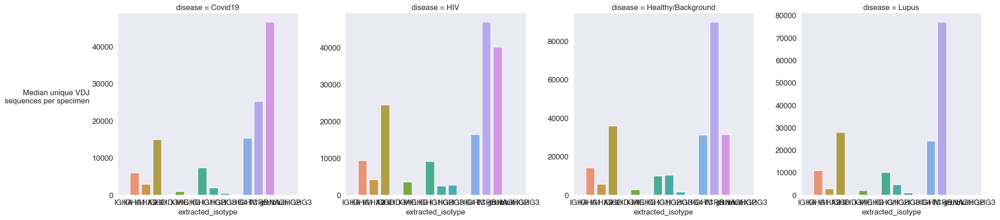

In [33]:
g = sns.catplot(
    data=num_unique_vdj_per_specimen_isotype_df.groupby(
        ["disease", "extracted_isotype"]
    )["num_unique_vdj_per_specimen_isotype"]
    .median()
    .reset_index(),
    x="extracted_isotype",
    y="num_unique_vdj_per_specimen_isotype",
    col="disease",
    col_wrap=5,
    kind="bar",
    sharey=False,
    #     aspect=0.6,
    sharex=True,
    ci=False,
)
g.set_ylabels(
    "Median unique VDJ\nsequences per specimen", rotation=0, horizontalalignment="right"
)


genetools.plots.savefig(
    g.fig,
    f"{config.paths.base_output_dir}/repertoire_read_counts.unique_vdj_sequences.by_disesase.png",
    dpi=100,
)

# Graveyard (figuring out how to plot this)

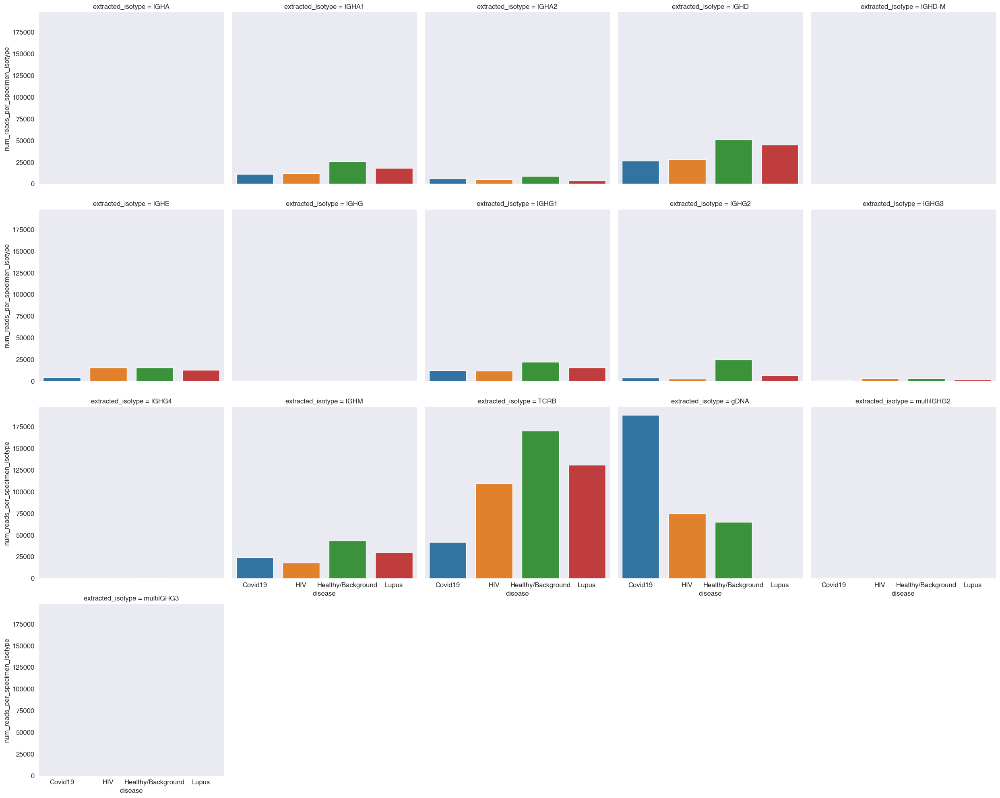

In [34]:
g = sns.catplot(
    data=num_reads_per_specimen_isotype_df.groupby(["disease", "extracted_isotype"])[
        "num_reads_per_specimen_isotype"
    ]
    .median()
    .reset_index(),
    x="disease",
    y="num_reads_per_specimen_isotype",
    col="extracted_isotype",
    col_wrap=5,
    kind="bar",
    #     aspect=0.6,
    sharex=True,
    ci=False,
)

In [35]:
test_df = pd.DataFrame(
    {
        "participant_label": ["a", "a", "b", "c"] * 2,
        "specimen_label": [1, 2, 3, 4] * 2,
        "extracted_isotype": ["IgA"] * 4 + ["IgD"] * 4,
        "num_reads_per_specimen_isotype": [10, 6, 8, 9, 5, 15, 4, 3],
    }
)
test_df

,participant_label,specimen_label,extracted_isotype,num_reads_per_specimen_isotype
0,a,1,IgA,10
1,a,2,IgA,6
2,b,3,IgA,8
3,c,4,IgA,9
4,a,1,IgD,5
5,a,2,IgD,15
6,b,3,IgD,4
7,c,4,IgD,3


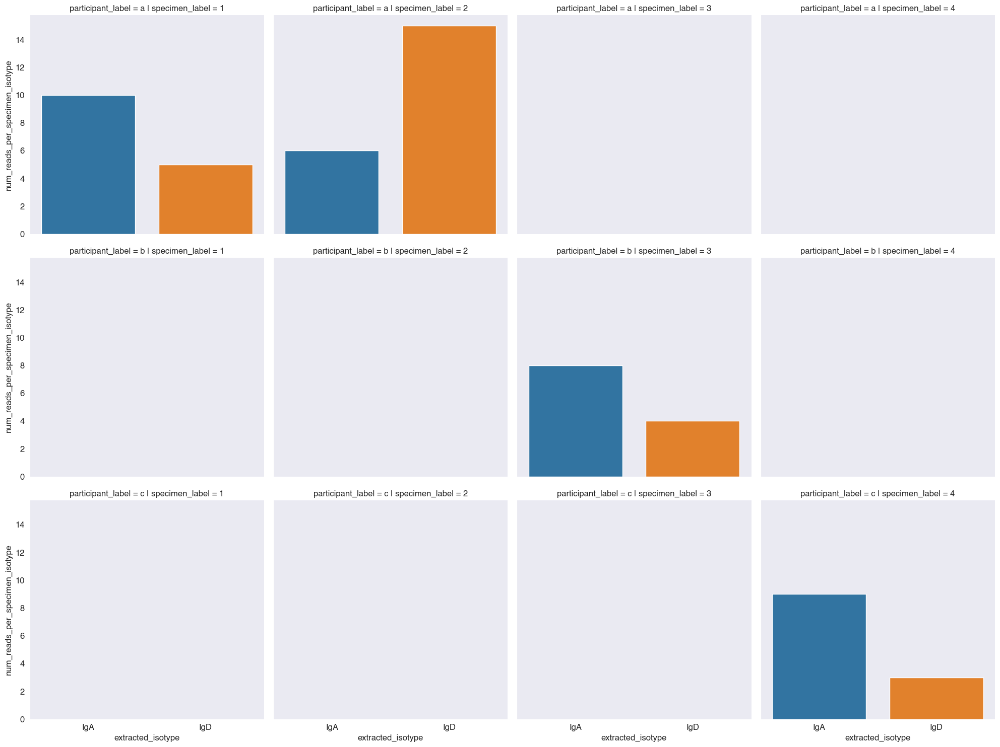

In [36]:
# num_reads_per_specimen_isotype_c
g = sns.catplot(
    data=test_df,
    x="extracted_isotype",
    y="num_reads_per_specimen_isotype",
    row="participant_label",
    col="specimen_label",
    kind="bar",
    sharey=True,
)

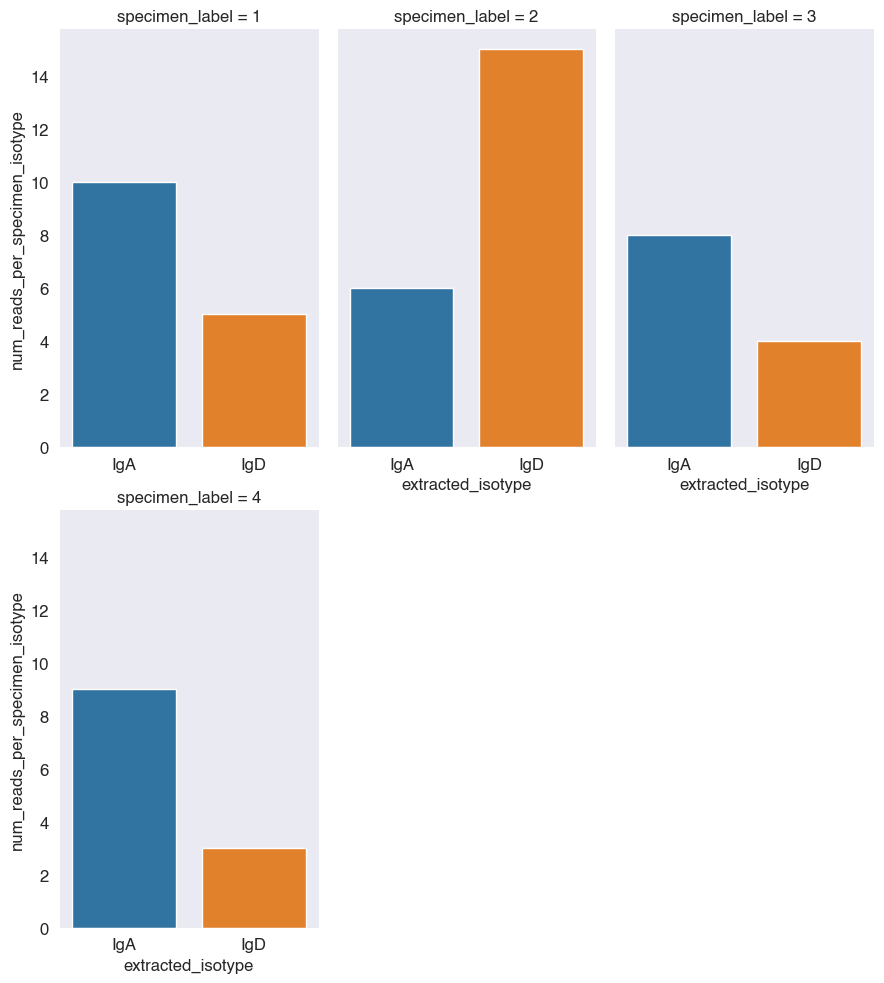

In [37]:
# num_reads_per_specimen_isotype_c
g = sns.catplot(
    data=test_df,
    x="extracted_isotype",
    y="num_reads_per_specimen_isotype",
    col="specimen_label",
    col_wrap=3,
    kind="bar",
    sharey=True,
    aspect=0.6,
    sharex=True,
)
# repeat x axis labels for all facets
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True)

In [38]:
test_df = pd.DataFrame(
    {
        "specimen_label": [1, 2, 3, 4, 5, 6, 7, 8] * 2,
        "extracted_isotype": ["IgA"] * 4 + ["IgD"] * 4 + ["IgE"] * 4 + ["IgM"] * 4,
        "num_reads_per_specimen_isotype": [10, 6, 8, 9, 5, 15, 4, 3] * 2,
    }
)
test_df

,specimen_label,extracted_isotype,num_reads_per_specimen_isotype
0,1,IgA,10
1,2,IgA,6
2,3,IgA,8
3,4,IgA,9
4,5,IgD,5
5,6,IgD,15
6,7,IgD,4
7,8,IgD,3
8,1,IgE,10
9,2,IgE,6


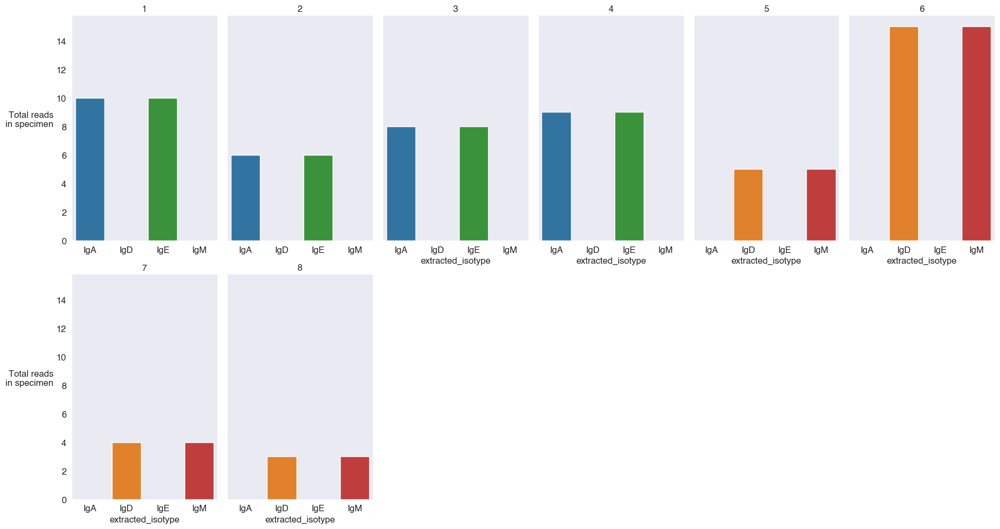

In [39]:
# num_reads_per_specimen_isotype_c
g = sns.catplot(
    data=test_df,
    x="extracted_isotype",
    y="num_reads_per_specimen_isotype",
    col="specimen_label",
    col_wrap=6,
    kind="bar",
    sharey=True,
    aspect=0.6,
    sharex=True,
)

# Remove "specimen_label =" prefix for titles
g.set_titles("{col_name}")

g.set_ylabels("Total reads\nin specimen", rotation=0, horizontalalignment="right")

# repeat x axis labels for all facets
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True)

In [40]:
# num_unique_vdj_per_specimen_isotype = (
#     df.groupby(["participant_label", "specimen_label"])
#     .size()
#     .rename("num_unique_vdj_per_specimen_isotype")
# )

In [41]:
# num_unique_vdj_per_specimen_isotype

In [42]:
# dask.visualize(
#     num_unique_vdj_per_specimen_isotype,
#     filename="num_unique_vdj_per_specimen_isotype.dask_task_graph.pdf",
# )

In [43]:
# num_unique_vdj_per_specimen_isotype_c = dask.compute(
#     num_unique_vdj_per_specimen_isotype
# )

In [44]:
# num_unique_vdj_per_specimen_isotype_c

In [45]:
# num_unique_vdj_per_specimen_isotype_c = num_unique_vdj_per_specimen_isotype_c[0]

In [46]:
# num_unique_vdj_per_specimen_isotype_c.max()

In [47]:
# num_unique_vdj_per_specimen_isotype_c = (
#     num_unique_vdj_per_specimen_isotype_c.reset_index()
# )

In [48]:
# # test
# num_unique_vdj_per_specimen_isotype_c["extracted_isotype"] = "IgA"

In [49]:
# g = sns.catplot(
#     data=num_unique_vdj_per_specimen_isotype_c,
#     x="extracted_isotype",
#     y="num_unique_vdj_per_specimen_isotype",
#     col="specimen_label",
#     col_wrap=6,
#     kind="bar",
#     sharey=True,
#     aspect=0.6,
#     sharex=True,
#     ci=False,
# )

# # Remove "specimen_label =" prefix for titles
# g.set_titles("{col_name}")

# g.set_ylabels("Total reads\nin specimen", rotation=0, horizontalalignment="right")

# # repeat x axis labels for all facets
# for ax in g.axes.flatten():
#     ax.tick_params(labelbottom=True)